In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.backends.cudnn as cudnn
import torch.utils.data as data
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
import torchvision.datasets as datasets
from PIL import Image

from utils import *
from dataset import *
from metrics import *
from FCN.fcn8 import *
from FCN.fcn16 import *
from FCN.fcn32 import *
# from FCN.fcn32_alex import *
# from FCN.fcn32_google import *
# from FCN.fcn32_alex import *

In [2]:
set_seed(1)
os.environ["CUDA_VISIBLE_DEVICES"] = '2'


In [3]:
def findmax(dic):
    loss = {'train':[], 'val':[]}
    pacc = {'train':[], 'val':[]}
    macc = {'train':[], 'val':[]}
    mIU = {'train':[], 'val':[]}
    fIU = {'train':[], 'val':[]}

    for i in range(len(dic['train'])):
        loss['val'].append(dic['val'][i][0])
        pacc['val'].append(dic['val'][i][1])
        macc['val'].append(dic['val'][i][2])
        mIU['val'].append(dic['val'][i][3])
        fIU['val'].append(dic['val'][i][4])
        
    return max(loss['val']), max(pacc['val']), max(macc['val']), max(mIU['val']), max(fIU['val'])

In [4]:
# Each dictionary has [loss, pixel_acc, mean_acc, meanIU, f.w.IU]

fcn32dict = LoadDict('fcn32_metric_full')
fcn16dict = LoadDict('fcn16_metric')
fcn8Dict = LoadDict('fcn8_metric')

In [5]:
findmax(fcn32dict)

(1.3530974321328875,
 0.9490488679109793,
 0.8581680240857105,
 0.7261259115965312,
 0.8292456221749829)

In [6]:
findmax(fcn16dict)

(0.16922605494632445,
 0.9424495598368747,
 0.8455309974841678,
 0.7109697149696702,
 0.8203651121377485)

In [7]:
findmax(fcn8Dict)

(0.18877605307540454,
 0.9381172232225017,
 0.836524633454122,
 0.700581497397378,
 0.8140274159134302)

200 200


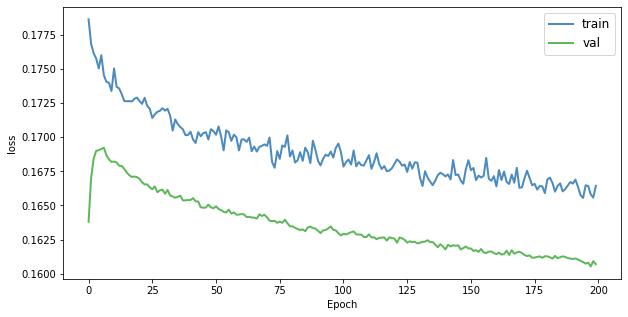

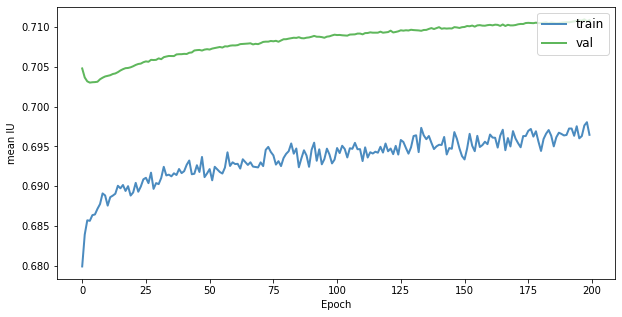

In [8]:
# plot train/val loss and mean IU of FCN16
loss = {'train':[], 'val':[]}
mIU = {'train':[], 'val':[]}

for i in range(200):
    loss['train'].append(fcn16dict['train'][i][0])
    loss['val'].append(fcn16dict['val'][i][0])
    
    mIU['train'].append(fcn16dict['train'][i][3])
    mIU['val'].append(fcn16dict['val'][i][3])
    
print(len(mIU['train']), len(mIU['val']))

plotCurve(loss, epoch=200)
plotCurve(mIU, epoch=200, typ = 'mean IU')

180 180


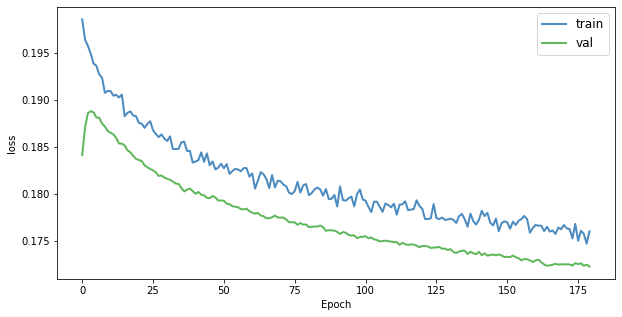

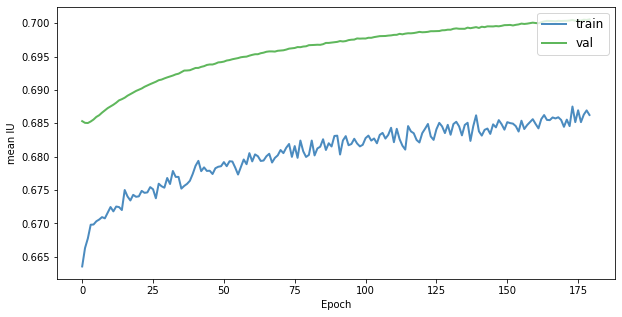

In [9]:
# plot train/val loss and mean IU of FCN16
loss = {'train':[], 'val':[]}
mIU = {'train':[], 'val':[]}

for i in range(180):
    loss['train'].append(fcn8Dict['train'][i][0])
    loss['val'].append(fcn8Dict['val'][i][0])
    
    mIU['train'].append(fcn8Dict['train'][i][3])
    mIU['val'].append(fcn8Dict['val'][i][3])
    
print(len(mIU['train']), len(mIU['val']))

plotCurve(loss, epoch=180)
plotCurve(mIU, epoch=180, typ = 'mean IU')

In [10]:
# Load data
train_data = VOC(mode = 'train', transform=transforms.ToTensor(), target_transform=transforms.ToTensor())

train_loader1 = data.DataLoader(train_data, batch_size=1, num_workers = 0, shuffle=False)
train_loader2 = data.DataLoader(train_data, batch_size=1, num_workers = 0, shuffle=False)
train_loader3 = data.DataLoader(train_data, batch_size=1, num_workers = 0, shuffle=False)

dataiter1 = iter(train_loader1)
dataiter2 = iter(train_loader2)
dataiter3 = iter(train_loader3)

In [11]:
# load each model
fcn32 = FCN32()
fcndict = LoadDict('fcn32_best')
fcn32.load_state_dict(fcndict, strict=True)
fcn32.eval()

fcn16 = FCN16()
fcndict = LoadDict('fcn16_best')
fcn16.load_state_dict(fcndict, strict=True)
fcn16.eval()

fcn8 = FCN8()
fcndict = LoadDict('fcn8_best')
fcn8.load_state_dict(fcndict, strict=True)
fcn8.eval()

print(0)

0


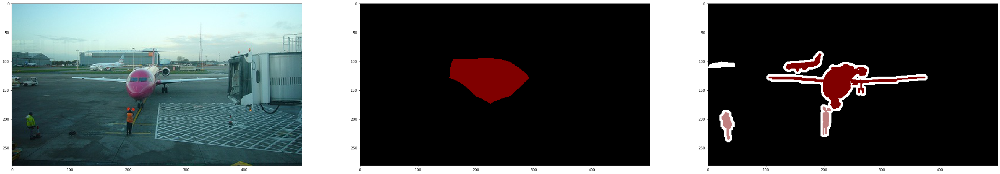

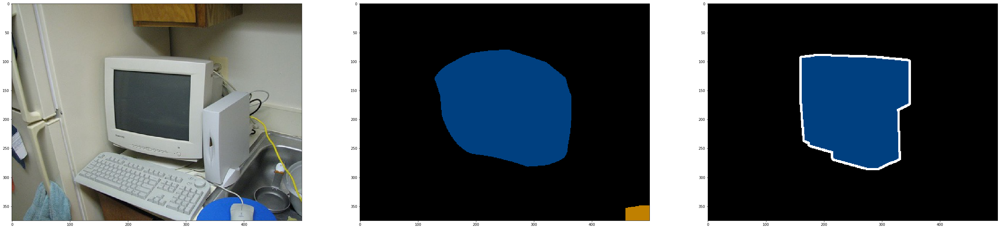

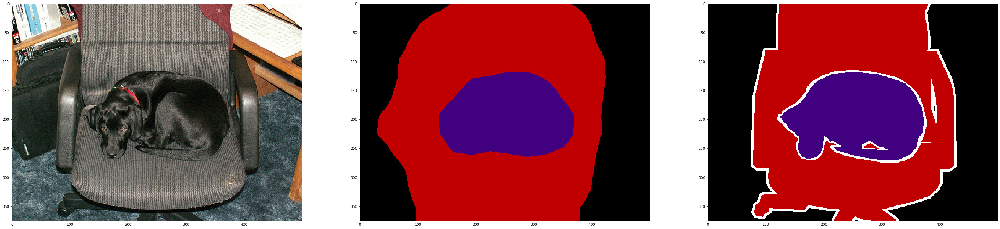

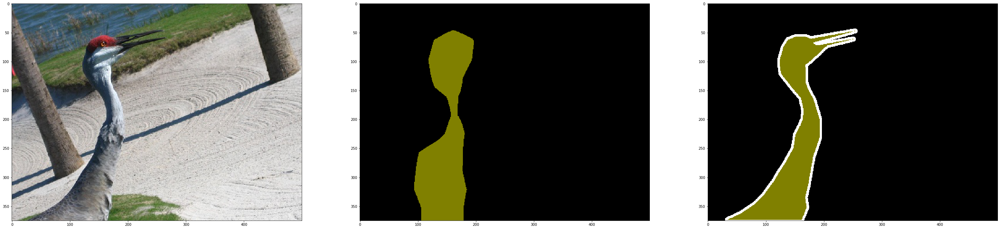

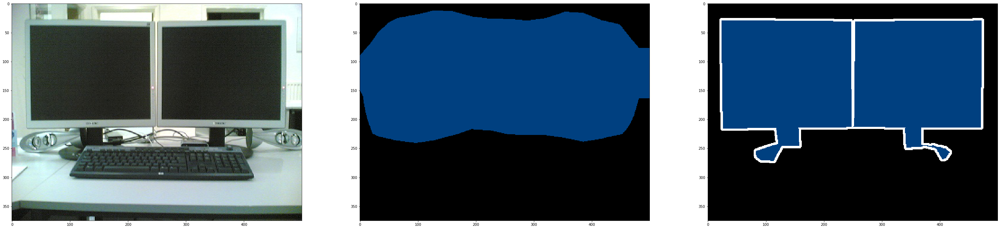

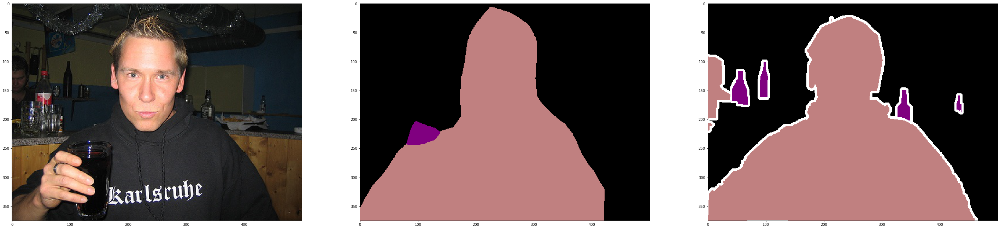

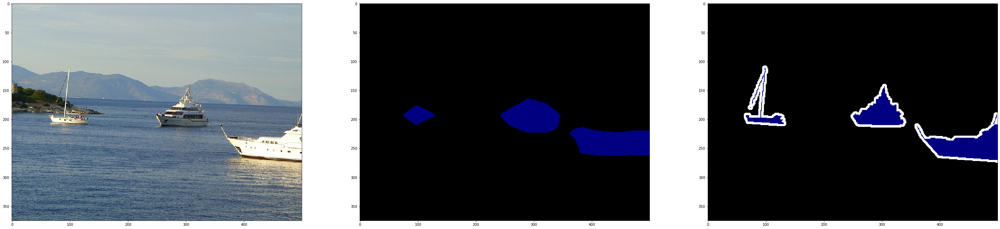

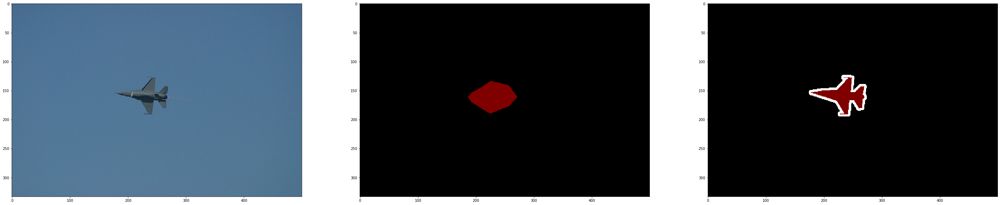

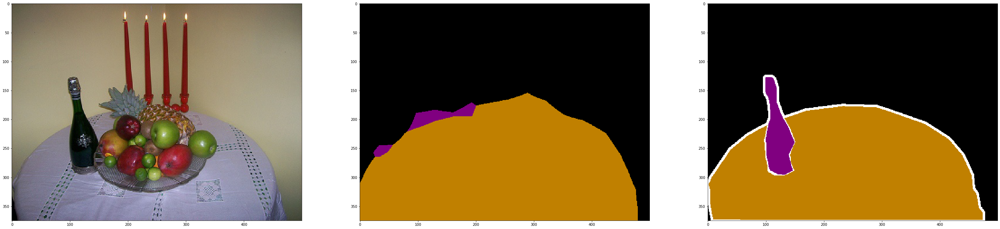

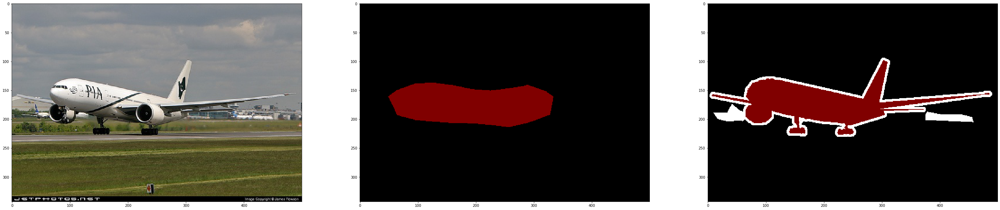

In [12]:
showResult(fcn32, dataiter1, 10)

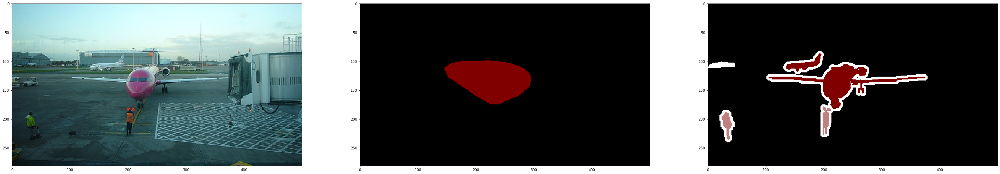

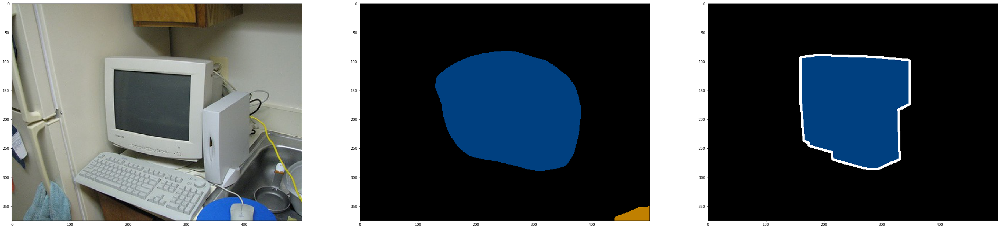

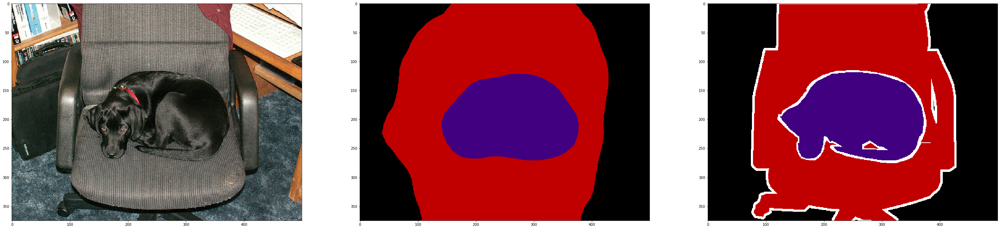

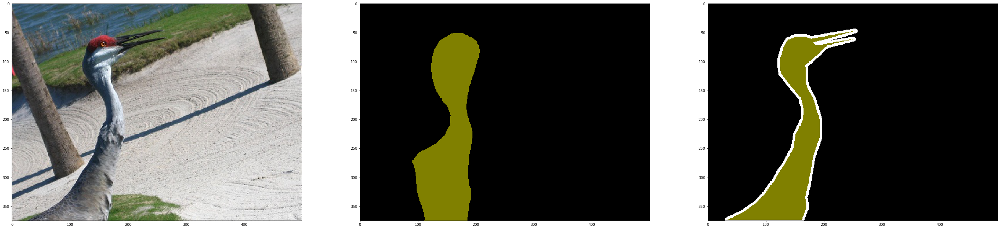

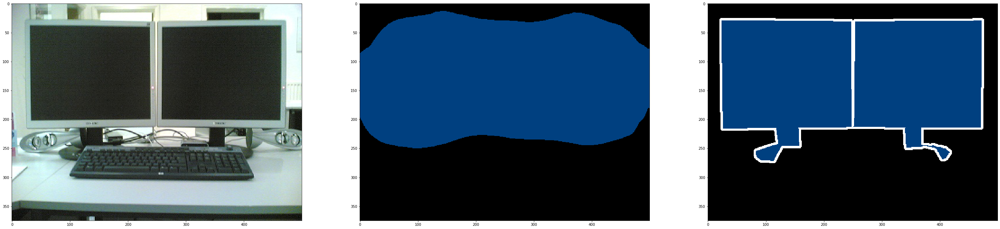

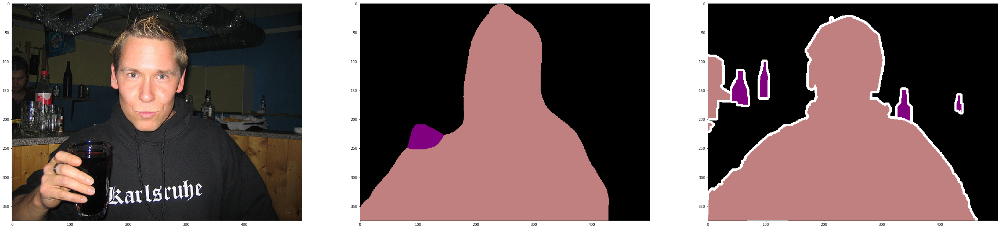

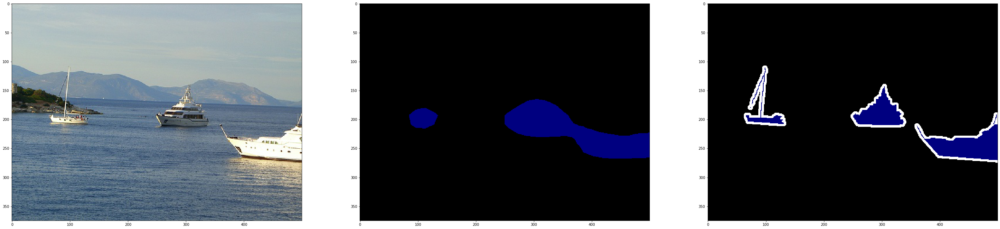

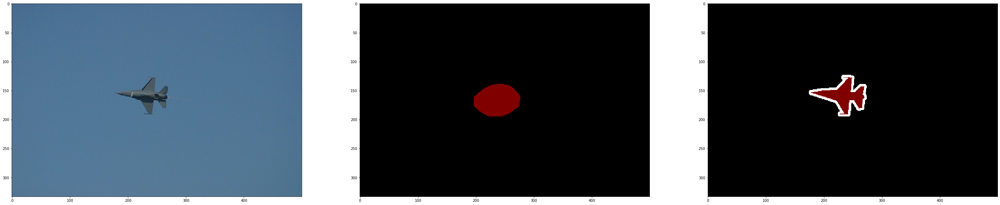

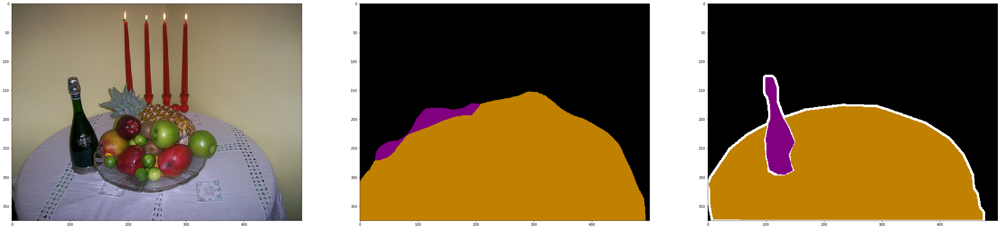

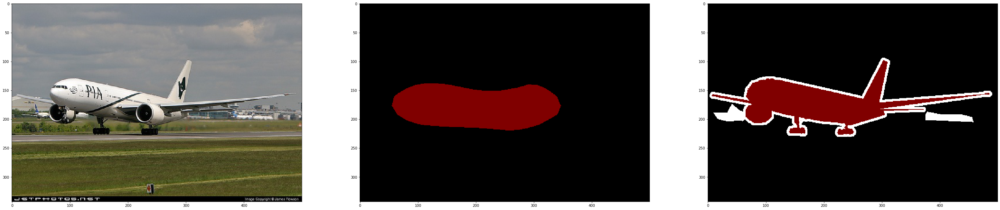

In [13]:
showResult(fcn16, dataiter2, 10)

In [ ]:
showResult(fcn8, dataiter3, 10)